# ONT Confidane score - Plot browser - no Threshold_mC
## T cells mapped to T2T version 2.0
## Pipeline to Extract and Analyze mC profiles from BAM files and look at Forward & Reverse strands

Modify the window of the input size

In [1]:
import sys
from pathlib import Path
from datetime import datetime
# from dimelo import parse_bam, plot_reads, load_processed, plot_read_browser
from dimelo import load_processed # read_vectors_from_hdf5 # parse_bam, plot_reads, load_processed, plot_read_browser


# Add the folder containing 'my_functions.py' to sys.path
sys.path.append("/home/michalula/code/epiCausality/epiCode/utils/") # str(Path(__file__).parent / 'utils'))

# Import the module or specific functions
# from /home/michalula/code/epiCausality/epiCode/utils/funcs_extract_mC_profiles_from_BAMs.py
# from funcs_extract_mC_profiles_from_BAMs import system_info, extract_from_bam
from funcs_extract_mC_profiles_from_BAMs import (
    system_info,
    get_reference_sequence,
    create_output_directory,
    extract_from_bam,
    process_extracted_reads,
    visualize_data,
    create_padded_reads,
    plot_padded_reads,
    save_padded_reads,
    process_extracted_reads_no_fully_unmethylated,
    create_padded_reads_no_fully_unmethylated
    # main,
)

modkit found with expected version 0.2.4


In [2]:
from funcs_analize_forward_reverse_extracted_mC_reads import analize_forward_reverse_CGs_pipeline

In [3]:
import numpy as np

import plotly.graph_objects as go


def plot_histogram(data, num_bins, title):
    # Compute the histogram
    hist, bin_edges = np.histogram(data, bins=num_bins)

    # Create the bar plot
    fig = go.Figure(data=[
        go.Bar(
            x=bin_edges[:-1],  # Start of each bin
            y=hist,            # Frequency in each bin
            width=np.diff(bin_edges),  # Width of each bin
            marker=dict(color='blue', opacity=0.7)
        )
    ])

    # Add labels and title
    fig.update_layout(
        title=title,
        xaxis_title="mod_vector values",
        yaxis_title="Frequency",
        bargap=0.1
    )

    return fig
    

# Define the number of bins
# num_bins = 50
# title=f"Distribution of Non-Zero mod_vector Values<br>Experiment: {experiment_name}<br>Region length: {region_length} [{region_str}]"
# fig_hist = plot_histogram(data=filtered_mod_vector_no0, num_bins=num_bins, title=title)
# # Show the plot
# fig_hist.show()

def plot_mov_values_percentages(filtered_mod_vector_no0):
    # Compute the histogram
    hist, bin_edges = np.histogram(filtered_mod_vector_no0, bins=num_bins)

    # Normalize the histogram to percentages
    percentages = (hist / len(filtered_mod_vector_no0)) * 100

    # Create the bar plot
    fig = go.Figure(data=[
        go.Bar(
            x=bin_edges[:-1],  # Start of each bin
            y=percentages,     # Percentage in each bin
            width=np.diff(bin_edges),  # Width of each bin
            marker=dict(color='blue', opacity=0.7)
        )
    ])

    # Add labels and title
    fig.update_layout(
        title=f"Percentage Distribution of Non-Zero mod_vector Values<br>Experiment: {experiment_name}<br>Region length: {region_length} [{region_str}]",
        xaxis_title="mod_vector values",
        yaxis_title="Percentage",
        bargap=0.1
    )

    # Show the plot
    fig.show()

    # Print the percentage values in each bin
    for i in range(len(percentages)):
        print(f"Bin {i + 1}: Range [{bin_edges[i]:.4f}, {bin_edges[i + 1]:.4f}) - Percentage: {percentages[i]:.2f}%")

# plot_mov_values_percentages(filtered_mod_vector_no0)

def mod_vectors_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs,
    # ref_genome_path,
    # output_dir,
    # threshold_mC=None,
    ):
    # extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    #     experiment_name=experiment_name,
    #     bam_path=bam_path,
    #     ref_genome_file=ref_genome_path,
    #     output_dir=output_dir,
    #     regions=region_str,
    #     motifs=motifs,
    #     output_name='extracted_reads',
    #     threshold_mC=threshold_mC,
    # )
    sorted_read_tuples, readwise_datasets, regions_dict = load_processed.read_vectors_from_hdf5(
                                            extract_file,  # extract_file, #     file: str | Path,
                                            motifs=motifs,  #     motifs: list[str],
                                            regions=region_str,  #     regions: str | Path | list[str | Path] | None = None,
                                            #     window_size: int | None = None,
                                            #     single_strand: bool = False,
                                            #     sort_by: str | list[str] = ["chromosome", "region_start", "read_start"],
                                            #     calculate_mod_fractions: bool = True,
                                        ) # -> tuple[list[tuple], list[str], dict | None]


    # Aggregate the second elements (mod_vector) from all tuples
    aggregated_mod_vector = [read[1] for read in sorted_read_tuples] # np.sum(, axis=0
    # print('aggregated_mod_vector', aggregated_mod_vector)                      

    flattened_mod_vector = np.concatenate(aggregated_mod_vector)
    # print("flattened_mod_vector", flattened_mod_vector)

    # Filter out values equal to 0
    filtered_mod_vector_no0 = flattened_mod_vector[flattened_mod_vector != 0]

    # Define the number of bins
    # num_bins = 50
    title=f"Distribution of Non-Zero mod_vector Values<br>Experiment: {experiment_name}<br>Region length: {region_length} [{region_str}]"
    fig_hist = plot_histogram(data=filtered_mod_vector_no0, num_bins=num_bins, title=title)
    # Show the plot
    fig_hist.show()

    plot_mov_values_percentages(filtered_mod_vector_no0)

    return sorted_read_tuples, readwise_datasets, regions_dict, aggregated_mod_vector, filtered_mod_vector_no0

# sorted_read_tuples, readwise_datasets, regions_dict, aggregated_mod_vector, filtered_mod_vector_no0 = mod_vectors_analyze(
#         experiment_name,
#         extract_file, # bam_path,
#         region_str,
#         motifs
#     )

## Extract Extranded window around the 30 bp ROI of unedited primary T cells from Elain ES from nCATs nanopore experiment using P2 on 2004-12-16

## Setting mC threshold in methylation calling confidance to 0.7

# Expend window size

In [4]:
threshold_mC = None # 0.7 #  0.9 #0.99

system_info()

experiment_name = "ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2"
bam_path = "/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TcellsPrES_unedit_P2R9/passed_fast5/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
# bam_path = "/home/michalula/data/cas9_nanopore/data/20241226_nCATs_K562_ZFPOFFpostSort_LOW70/pod5_converted_basecall/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_nCATs_K562_ZFPOFFpostSort_LOW70_R9min_converted_fast5.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
# "/home/michalula/data/cas9_nanopore/data/20241226_nCATs_K562_ZFPOFFpostSort_LOW70/pod5_converted_basecall/5mCG/to_t2t_v1_1/sort_align_t2t_v1_1_trim_20241226_nCATs_K562_ZFPOFFpostSort_LOW70_R9min_converted_fast5.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
#  "/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TcellsPrES_unedit_P2R9/passed_fast5/5mCG/to_t2t_v1_1/sort_align_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"

date_today = datetime.today().strftime('%Y-%m-%d')

# Make sure to use UpperCase fasta in the Reference genome, so that the mapping of the sequence is got giving erorrs
# awk '{if ($0 ~ /^>/) print $0; else print toupper($0)}' /home/michalula/data/ref_genomes/t2t_v2_0/chm13v2.0.fa > /home/michalula/data/ref_genomes/t2t_v2_0/up_chm13v2.0.fasta
# samtools faidx /home/michalula/data/ref_genomes/t2t_v2_0/up_chm13v2.0.fasta
ref_genome_path = Path('/home/michalula/data/ref_genomes/t2t_v2_0/up_chm13v2.0.fasta')
# '/home/michalula/data/ref_genomes/t2t_v2_0/chm13v2.0.fa')
reg_genome_version = "t2t_v2_0"
# t2t_v1_1_cd55_30bps = 'chr1:206586162-206586192'
region_chr = 'chr1'

# Expend window size
expand_window_size = 50 # 50 #500 #1500 # 0 
expand_window_size
print("Expend window size by 2 * ", expand_window_size)
region_start = 206586162 - expand_window_size
region_end = 206586192 + expand_window_size + 1

# # 30 bps:
# region_start = 206586162
# region_end = 206586192

# # FULL 7 KB WINDOW: 1:206583000-206590000
# region_start = 206583000   # 206586162
# region_end = 206590000 # 20658619

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


save_padded_reads_name_np = f"padded_reads_{experiment_name}_mCthresh{threshold_mC}_{reg_genome_version}_{region_str}_{date_today}.npy"
output_dir = create_output_directory("./dimelo_v2_output")

motifs=['CG,0']
ref_seq_list = get_reference_sequence(ref_genome_path, region_chr, region_start, region_end)

print('region_chr', region_chr)
print('region_start', region_start)
print('region_end', region_end)
print(f'{region_chr}:{region_start}-{region_end}')

System: Linux
Release: 6.8.0-52-generic
Version: #53~22.04.1-Ubuntu SMP PREEMPT_DYNAMIC Wed Jan 15 19:18:46 UTC 2
Processor: x86_64
Python version: 3.11.9 | packaged by conda-forge | (main, Apr 19 2024, 18:36:13) [GCC 12.3.0]
Expend window size by 2 *  50
region_length 131
ACCATTCAGCGTTTTGGGGTCTGTTTGTTTTTATTGTTATCCCACCCCACACCGCCCCGAGGCGCGCGCGCGCGCGCGCACACACACACACACACACACACACACACATACACACACGCACACTGGTGAAT
131
region_chr chr1
region_start 206586112
region_end 206586243
chr1:206586112-206586243


In [5]:
# threshold_mC = None # 0 # 0.7 # 0.9 #0.99

extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name, 
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)

Region length: 131
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3007 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3007   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_131bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586112-206586243.html


In [6]:
extract_file

PosixPath('dimelo_v2_output/extracted_reads/reads.combined_basemods.h5')

In [8]:
# Define the number of bins
num_bins = 50

mod_vectors_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
)

Bin 1: Range [0.0020, 0.0219) - Percentage: 39.50%
Bin 2: Range [0.0219, 0.0418) - Percentage: 4.91%
Bin 3: Range [0.0418, 0.0617) - Percentage: 3.10%
Bin 4: Range [0.0617, 0.0817) - Percentage: 2.37%
Bin 5: Range [0.0817, 0.1016) - Percentage: 1.69%
Bin 6: Range [0.1016, 0.1215) - Percentage: 1.42%
Bin 7: Range [0.1215, 0.1415) - Percentage: 1.21%
Bin 8: Range [0.1415, 0.1614) - Percentage: 1.12%
Bin 9: Range [0.1614, 0.1813) - Percentage: 1.10%
Bin 10: Range [0.1813, 0.2012) - Percentage: 0.93%
Bin 11: Range [0.2012, 0.2212) - Percentage: 1.02%
Bin 12: Range [0.2212, 0.2411) - Percentage: 0.90%
Bin 13: Range [0.2411, 0.2610) - Percentage: 0.80%
Bin 14: Range [0.2610, 0.2810) - Percentage: 0.80%
Bin 15: Range [0.2810, 0.3008) - Percentage: 0.70%
Bin 16: Range [0.3008, 0.3208) - Percentage: 0.77%
Bin 17: Range [0.3208, 0.3408) - Percentage: 0.67%
Bin 18: Range [0.3408, 0.3606) - Percentage: 0.60%
Bin 19: Range [0.3606, 0.3806) - Percentage: 0.66%
Bin 20: Range [0.3806, 0.4004) - Percen

([('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.009766],
         dtype=float16),
   'CG,0',
   np.int32(206589906),
   '70716b3a-2687-497e-aec2-2437dfefae48',
   np.int32(206580868),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.0810546875)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.1543], dtype=float16),
   'CG,0',
   np.int32(206589921),
   '725648dd-2bba-438a-90af-ed194c97f6a6',
   np.int32(206582396),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.2740885416666667)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.166], dtype=float16),
   'CG,0',
   np.int32(206589899),
   '8af377a7-1457-4903-88e4-3687a74fb360',
   np.int32(206582555),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.2016059027777778)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0

In [6]:
import h5py

# Path to the HDF5 file
h5_file_path = output_dir / 'extracted_reads/reads.combined_basemods.h5'

# Open the HDF5 file and display its contents
with h5py.File(h5_file_path, 'r') as h5_file:
    def print_h5_structure(name, obj):
        if isinstance(obj, h5py.Group):
            print(f"Group: {name}")
        elif isinstance(obj, h5py.Dataset):
            print(f"Dataset: {name}, Shape: {obj.shape}, Dtype: {obj.dtype}")

    print("Contents of the HDF5 file:")
    h5_file.visititems(print_h5_structure)

Contents of the HDF5 file:
Dataset: chromosome, Shape: (3007,), Dtype: object
Dataset: mod_vector, Shape: (3007,), Dtype: object
Dataset: motif, Shape: (3007,), Dtype: object
Dataset: read_end, Shape: (3007,), Dtype: int32
Dataset: read_name, Shape: (3007,), Dtype: object
Dataset: read_start, Shape: (3007,), Dtype: int32
Dataset: strand, Shape: (3007,), Dtype: object
Dataset: threshold, Shape: (), Dtype: float64
Dataset: val_vector, Shape: (3007,), Dtype: object


the def read_vectors_from_hdf5:

"""
    Pulls a list of read data out of an .h5 file containing processed read vectors, formatted
    for read-by-read vector processing downstream use cases.

    The flow of operation here is we load up the h5 file then loop through our regions and pick
    out reads corresponding to our criteria. Criteria include chromosome, read starts and ends
    (compared to region starts and ends), motif, and strand (if single_strand is True). The indices
    for the desired reads are identified region-by-region, then all the reads for the region (or
    the whole h5, if no region is passed) are loaded using the process_data function and put into
    a list. The bytes are then decoded for the array entries, which are manually compressed because
    h5py wasn't behaving.

    There's some adjustment for the raw probability (no thresh) to match modkit extract outputs.
    Specifically, the 0-255 8bit int has 0.5 added before dividing by 256, giving mod qualities
    between 0.001953 and 0.99805 for bases in valid motifs. (Invalid positions have zeros.)

    After this processing, we calculate modification fractions, sort, and return.

    Args:
        file: Path to an hdf5 (.h5) file containing modification data for single reads,
            stored in datasets read_name, chromosome, read_start,
            read_end, base modification motif, mod_vector, and val_vector.
        regions: Single or list of Path objects or strings. Path objects must point to .bed
            files, strings can be .bed paths or region string in the format chrX:XXX-XXX.
            All should all be regions for which your original .bam file had reads extracted,
            although by design this method will not raise an error if any region contains
            zero reads, as this may simply be a matter of low read depth.
            If no regions are specified, the entire .h5 file will be returned. This may cause
            memory issues.
        motifs: types of modification to extract data for. Motifs are specified as
            {DNA_sequence},{position_of_modification}. For example, a methylated adenine is specified
            as 'A,0' and CpG methylation is specified as 'CG,0'.
        single_strand: True means we only grab counts from reads from the same strand as
            the region of interest, False means we always grab both strands within the regions
        window_size: An optional parameter for creating centered windows for the provided regions.
            If provided, all regions will be adjusted to be the same size and centered. If not provided,
            all regions should already be the same size, or there should be only one.
        sort_by: Read properties by which to sort, either one string or a list of strings. Options
            include chromosome, region_start, region_end, read_start, read_end, and motif. More to
            be added in future.

    Returns:
        a list of tuples, each tuple containing all datasets corresponding to an individual read that
        was within the specified regions.
        a list of strings, naming the datasets returned.
        a regions_dict, containing lists of (region_start,region_end) coordinates by chromosome/contig.
    """

In [18]:
sorted_read_tuples, readwise_datasets, regions_dict = load_processed.read_vectors_from_hdf5(
                                        extract_file,  # extract_file, #     file: str | Path,
                                        motifs=motifs,  #     motifs: list[str],
                                        regions=region_str,  #     regions: str | Path | list[str | Path] | None = None,
                                        #     window_size: int | None = None,
                                        #     single_strand: bool = False,
                                        #     sort_by: str | list[str] = ["chromosome", "region_start", "read_start"],
                                        #     calculate_mod_fractions: bool = True,
                                        # ) -> tuple[list[tuple], list[str], dict | None]
                                    )

In [20]:
sorted_read_tuples

[('chr1',
  array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.009766],
        dtype=float16),
  'CG,0',
  np.int32(206589906),
  '70716b3a-2687-497e-aec2-2437dfefae48',
  np.int32(206580868),
  '-',
  array([0, 0, 0, ..., 0, 0, 1]),
  206586112,
  206586243,
  '.',
  np.float64(0.0810546875)),
 ('chr1',
  array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.1543], dtype=float16),
  'CG,0',
  np.int32(206589921),
  '725648dd-2bba-438a-90af-ed194c97f6a6',
  np.int32(206582396),
  '-',
  array([0, 0, 0, ..., 0, 0, 1]),
  206586112,
  206586243,
  '.',
  np.float64(0.2740885416666667)),
 ('chr1',
  array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.166], dtype=float16),
  'CG,0',
  np.int32(206589899),
  '8af377a7-1457-4903-88e4-3687a74fb360',
  np.int32(206582555),
  '-',
  array([0, 0, 0, ..., 0, 0, 1]),
  206586112,
  206586243,
  '.',
  np.float64(0.2016059027777778)),
 ('chr1',
  array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.0371], dtype=float16),
  'CG,0',
  np.

In [28]:
read_i = sorted_read_tuples[0]
read_i[0]

'chr1'

In [30]:
mod_vector = read_i[1]
mod_vector

array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.009766],
      dtype=float16)

In [23]:
readwise_datasets

['chromosome',
 'mod_vector',
 'motif',
 'read_end',
 'read_name',
 'read_start',
 'strand',
 'val_vector',
 'region_start',
 'region_end',
 'region_strand',
 'CG,0_mod_fraction']

In [24]:
regions_dict

defaultdict(list, {'chr1': [(206586112, 206586243, '.')]})

In [33]:
import numpy as np

# Aggregate the second elements (mod_vector) from all tuples
aggregated_mod_vector = [read[1] for read in sorted_read_tuples] # np.sum(, axis=0

print(aggregated_mod_vector)

[array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.009766],
      dtype=float16), array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.1543], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.166], dtype=float16), array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.0371], dtype=float16), array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
      dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.705], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.    , 0.    , 0.    , ..., 0.8457, 0.    , 0.9785], dtype=float16), array([0.      , 0.      , 0.      , ..., 0.001953, 0.      , 0.001953],
      dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.    , 0.    , 0.    , ..., 0.1621, 0.    , 0.3574], dtype=float16), array([0.     , 0.     , 0.     , ..., 0.2715 , 0. 

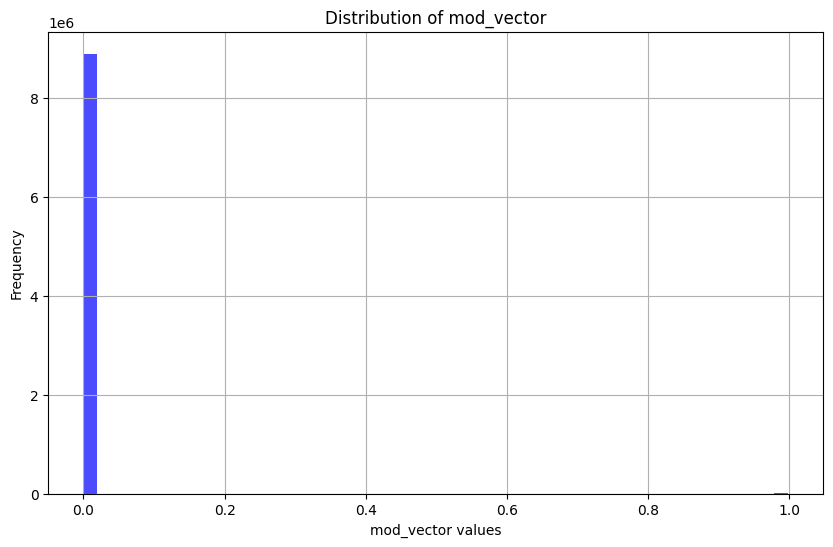

In [34]:
import matplotlib.pyplot as plt

# Flatten the aggregated_mod_vector into a single vector
flattened_mod_vector = np.concatenate(aggregated_mod_vector)

# Plot the distribution
plt.figure(figsize=(10, 6))
plt.hist(flattened_mod_vector, bins=50, color='blue', alpha=0.7)
plt.title('Distribution of mod_vector')
plt.xlabel('mod_vector values')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

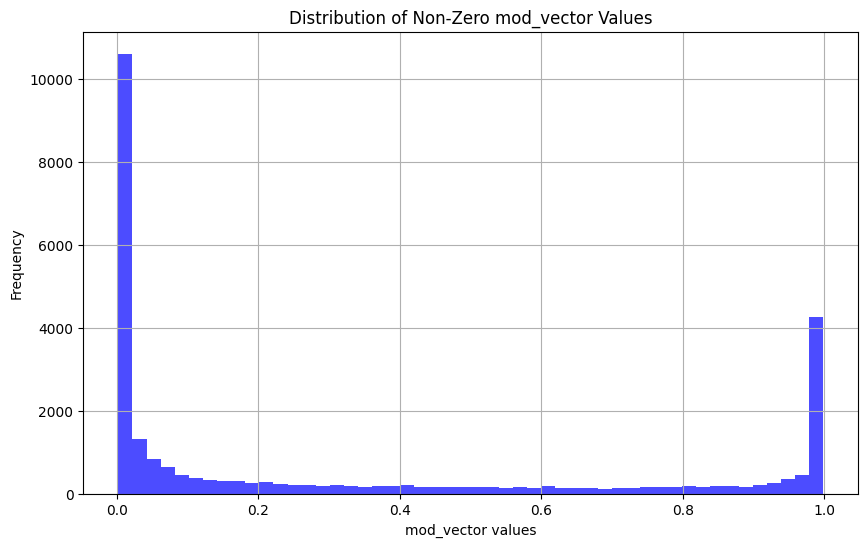

In [35]:
import matplotlib.pyplot as plt

# Filter out values equal to 0
filtered_mod_vector_no0 = flattened_mod_vector[flattened_mod_vector != 0]

# Plot the distribution
plt.figure(figsize=(10, 6))
plt.hist(filtered_mod_vector_no0, bins=50, color='blue', alpha=0.7)
plt.title('Distribution of Non-Zero mod_vector Values')
plt.xlabel('mod_vector values')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [39]:
import numpy as np

import plotly.graph_objects as go

# Define the number of bins
num_bins = 50

# Compute the histogram
hist, bin_edges = np.histogram(flattened_mod_vector, bins=num_bins)

# Create the bar plot
fig = go.Figure(data=[
    go.Bar(
        x=bin_edges[:-1],  # Start of each bin
        y=hist,            # Frequency in each bin
        width=np.diff(bin_edges),  # Width of each bin
        marker=dict(color='blue', opacity=0.7)
    )
])

# Add labels and title
fig.update_layout(
    title=f"Distribution full mod_vector Values<br>Experiment: {experiment_name}<br>Region: {region_str}",
    xaxis_title="mod_vector values",
    yaxis_title="Frequency",
    bargap=0.1
)

# Show the plot
fig.show()

# Print the values in each bin
for i in range(len(hist)):
    print(f"Bin {i + 1}: Range [{bin_edges[i]:.4f}, {bin_edges[i + 1]:.4f}) - Count: {hist[i]}")

Bin 1: Range [0.0000, 0.0200) - Count: 8894396
Bin 2: Range [0.0200, 0.0399) - Count: 1550
Bin 3: Range [0.0399, 0.0599) - Count: 902
Bin 4: Range [0.0599, 0.0798) - Count: 667
Bin 5: Range [0.0798, 0.0998) - Count: 566
Bin 6: Range [0.0998, 0.1198) - Count: 382
Bin 7: Range [0.1198, 0.1396) - Count: 326
Bin 8: Range [0.1396, 0.1597) - Count: 301
Bin 9: Range [0.1597, 0.1797) - Count: 295
Bin 10: Range [0.1797, 0.1996) - Count: 250
Bin 11: Range [0.1996, 0.2195) - Count: 230
Bin 12: Range [0.2195, 0.2395) - Count: 237
Bin 13: Range [0.2395, 0.2595) - Count: 226
Bin 14: Range [0.2595, 0.2793) - Count: 213
Bin 15: Range [0.2793, 0.2993) - Count: 226
Bin 16: Range [0.2993, 0.3193) - Count: 208
Bin 17: Range [0.3193, 0.3394) - Count: 180
Bin 18: Range [0.3394, 0.3594) - Count: 162
Bin 19: Range [0.3594, 0.3792) - Count: 177
Bin 20: Range [0.3792, 0.3992) - Count: 172
Bin 21: Range [0.3992, 0.4192) - Count: 162
Bin 22: Range [0.4192, 0.4390) - Count: 164
Bin 23: Range [0.4390, 0.4590) - Cou

In [43]:
import numpy as np

import plotly.graph_objects as go

# Define the number of bins
num_bins = 50

# Compute the histogram
hist, bin_edges = np.histogram(filtered_mod_vector_no0, bins=num_bins)

# Create the bar plot
fig = go.Figure(data=[
    go.Bar(
        x=bin_edges[:-1],  # Start of each bin
        y=hist,            # Frequency in each bin
        width=np.diff(bin_edges),  # Width of each bin
        marker=dict(color='blue', opacity=0.7)
    )
])

# Add labels and title
fig.update_layout(
    title=f"Distribution of Non-Zero mod_vector Values<br>Experiment: {experiment_name}<br>Region length: {region_length} [{region_str}]",
    xaxis_title="mod_vector values",
    yaxis_title="Frequency",
    bargap=0.1
)

# Show the plot
fig.show()

# Print the values in each bin
for i in range(len(hist)):
    print(f"Bin {i + 1}: Range [{bin_edges[i]:.4f}, {bin_edges[i + 1]:.4f}) - Count: {hist[i]}")

Bin 1: Range [0.0020, 0.0219) - Count: 10602
Bin 2: Range [0.0219, 0.0418) - Count: 1317
Bin 3: Range [0.0418, 0.0617) - Count: 832
Bin 4: Range [0.0617, 0.0817) - Count: 637
Bin 5: Range [0.0817, 0.1016) - Count: 454
Bin 6: Range [0.1016, 0.1215) - Count: 382
Bin 7: Range [0.1215, 0.1415) - Count: 326
Bin 8: Range [0.1415, 0.1614) - Count: 301
Bin 9: Range [0.1614, 0.1813) - Count: 295
Bin 10: Range [0.1813, 0.2012) - Count: 250
Bin 11: Range [0.2012, 0.2212) - Count: 274
Bin 12: Range [0.2212, 0.2411) - Count: 241
Bin 13: Range [0.2411, 0.2610) - Count: 215
Bin 14: Range [0.2610, 0.2810) - Count: 215
Bin 15: Range [0.2810, 0.3008) - Count: 187
Bin 16: Range [0.3008, 0.3208) - Count: 208
Bin 17: Range [0.3208, 0.3408) - Count: 180
Bin 18: Range [0.3408, 0.3606) - Count: 162
Bin 19: Range [0.3606, 0.3806) - Count: 177
Bin 20: Range [0.3806, 0.4004) - Count: 172
Bin 21: Range [0.4004, 0.4204) - Count: 198
Bin 22: Range [0.4204, 0.4404) - Count: 155
Bin 23: Range [0.4404, 0.4602) - Count


    There's some adjustment for the raw probability (no thresh) to match modkit extract outputs.
    Specifically, the 0-255 8bit int has 0.5 added before dividing by 256, giving mod qualities
    between 0.001953 and 0.99805 for bases in valid motifs. (Invalid positions have zeros.)

In [44]:
# threshold_mC = None # 0 # 0.7 # 0.9 #0.99

region_chr = 'chr1'
# # 30 bps:
# region_start = 206586162
# region_end = 206586192

# FULL 7 KB WINDOW: 1:206583000-206590000
region_start = 206583000   # 206586162
region_end = 206590000 # 20658619


region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)

region_length 7000
Region length: 7000
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3574 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3574   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_7000bps_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206583000-206590000.html


In [45]:
extract_file, extract_regions

(PosixPath('dimelo_v2_output/extracted_reads/reads.combined_basemods.h5'),
 PosixPath('dimelo_v2_output/extracted_reads/regions.processed.bed'))

In [51]:
sorted_read_tuples, readwise_datasets, regions_dict = load_processed.read_vectors_from_hdf5(
                                        extract_file,  # extract_file, #     file: str | Path,
                                        motifs=motifs,  #     motifs: list[str],
                                        regions=region_str,  #     regions: str | Path | list[str | Path] | None = None,
                                        #     window_size: int | None = None,
                                        #     single_strand: bool = False,
                                        #     sort_by: str | list[str] = ["chromosome", "region_start", "read_start"],
                                        #     calculate_mod_fractions: bool = True,
                                    ) # -> tuple[list[tuple], list[str], dict | None]


# Aggregate the second elements (mod_vector) from all tuples
aggregated_mod_vector = [read[1] for read in sorted_read_tuples] # np.sum(, axis=0
print('aggregated_mod_vector', aggregated_mod_vector)                      

flattened_mod_vector = np.concatenate(aggregated_mod_vector)
print("flattened_mod_vector", flattened_mod_vector)

# Filter out values equal to 0
filtered_mod_vector_no0 = flattened_mod_vector[flattened_mod_vector != 0]

sorted_read_tuples

aggregated_mod_vector [array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.99], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.1113], dtype=float16), array([0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,
       0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   , 0.   ,

[('chr1',
  array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
  'CG,0',
  np.int32(206583155),
  '83c80a8e-2405-40a1-bd1a-9d9f8863c847',
  np.int32(206572896),
  '-',
  array([0, 0, 0, ..., 0, 0, 1]),
  206583000,
  206590000,
  '.',
  np.float64(0.998046875)),
 ('chr1',
  array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
  'CG,0',
  np.int32(206583151),
  'ebd335fb-50df-43df-b043-8a63d686e18c',
  np.int32(206574357),
  '-',
  array([0, 0, 0, ..., 0, 0, 1]),
  206583000,
  206590000,
  '.',
  np.float64(0.998046875)),
 ('chr1',
  array([0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.99], dtype=float16),
  'CG,0',
  np.int32(206583152),
  'bb79378b-63cc-49d3-bef5-73e92dc9e412',
  np.int32(206578695),
  '-',
  array([0, 0, 0, ..., 0, 0, 1]),
  206583000,
  206590000,
  '.',
  np.float64(0.990234375)),
 ('chr1',
  array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
  'CG,0',
  np.int32(206589889),
  '70716b3a-2687-497e-aec2-2437dfefae48',

In [ ]:
# import numpy as np

# import plotly.graph_objects as go

# # Define the number of bins
# num_bins = 50

# def plot_histogram(data, num_bins, title):
#     # Compute the histogram
#     hist, bin_edges = np.histogram(data, bins=num_bins)

#     # Create the bar plot
#     fig = go.Figure(data=[
#         go.Bar(
#             x=bin_edges[:-1],  # Start of each bin
#             y=hist,            # Frequency in each bin
#             width=np.diff(bin_edges),  # Width of each bin
#             marker=dict(color='blue', opacity=0.7)
#         )
#     ])

#     # Add labels and title
#     fig.update_layout(
#         title=title,
#         xaxis_title="mod_vector values",
#         yaxis_title="Frequency",
#         bargap=0.1
#     )

#     return fig
    

title=f"Distribution of Non-Zero mod_vector Values<br>Experiment: {experiment_name}<br>Region length: {region_length} [{region_str}]"
fig_hist = plot_histogram(data=filtered_mod_vector_no0, num_bins=num_bins, title=title)
# Show the plot
fig_hist.show()

In [ ]:
# keep_unmethylated_reads = False

# if extract_file:
#     if keep_unmethylated_reads:
#         reads_df, regions_dict = process_extracted_reads(extract_file, region_str, motifs, ref_seq_list)
#         visualize_data(reads_df)

#         padded_reads = create_padded_reads(reads_df, regions_dict, region_length)
#     else:
#         reads_df, regions_dict = process_extracted_reads_no_fully_unmethylated(extract_file, region_str, motifs, ref_seq_list)
#         visualize_data(reads_df)
#         padded_reads = create_padded_reads_no_fully_unmethylated(reads_df, regions_dict, region_length)
#     if padded_reads is not None:
#         plot_padded_reads(padded_reads, ref_seq_list)
#         save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np)

# # if extract_file:
# #     reads_df, regions_dict = process_extracted_reads(extract_file, region_str, motifs, ref_seq_list)
# #     visualize_data(reads_df)

# #     padded_reads = create_padded_reads(reads_df, regions_dict, region_length)
# #     if padded_reads is not None:
# #         plot_padded_reads(padded_reads, ref_seq_list)
# #         save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np)
 

Error processing extracted reads: No threshold has been applied to this .h5 single read data. You must provide a threshold using the thresh parameter in order to extract binarized modification arrays.
Error in visualization: 'NoneType' object has no attribute 'copy'
Error creating padded reads matrix: 'NoneType' object is not subscriptable


In [8]:
"""
Main pipeline for processing and visualizing CpG units on forward and reverse strands 
"""
try:
    # Define constants
    # experiment_name = "unedited_T_primerES_nCATS"
    # save_folder_path = output_dir # "/home/michalula/code/epiCausality/epiCode/notebooks/dimelo_v2_output"
    # save_padded_reads_name_np = "padded_reads.npy"
    # ref_genome_file = "/home/michalula/data/ref_genomes/to_t2t_v1_1/chm13.draft_v1.1.fasta"
    # region_chr = "chr1"
    # region_start = 206586162
    # region_end = 206586192

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")


Error loading padded reads: [Errno 2] No such file or directory: 'dimelo_v2_output/padded_reads_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_mCthreshNone_t2t_v2_0_chr1:206586112-206586243_2025-04-01.npy'
Error in process pipeline: [Errno 2] No such file or directory: 'dimelo_v2_output/padded_reads_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_mCthreshNone_t2t_v2_0_chr1:206586112-206586243_2025-04-01.npy'
Error in main pipeline (analize_forward_reverse_CGs_pipeline function): [Errno 2] No such file or directory: 'dimelo_v2_output/padded_reads_ThrNone_unedited_Tcells_ES_NoFullyUnmethylated_T2Tv2_mCthreshNone_t2t_v2_0_chr1:206586112-206586243_2025-04-01.npy'


# Analyze the Edited cells from the same cells other sorted part 

In [9]:
system_info()

experiment_name = "ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2" 

# threshold_mC = 0.9 # 0.75 # 0.99
bam_path ="/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9/pod5_converted_basecall/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"

# "/home/michalula/data/cas9_nanopore/data/20241226_nCATS_K562_ZFPOFFpostSort_HIGH/pod5_converted_basecall/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_nCATS_K562_ZFPOFFpostSort_HIGH_R9min_converted_fast5.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"

#  "/home/michalula/data/cas9_nanopore/data/20241226_nCATS_K562_ZFPOFFpostSort_HIGH/pod5_converted_basecall/5mCG/to_t2t_v1_1/sort_align_t2t_v1_1_trim_20241226_nCATS_K562_ZFPOFFpostSort_HIGH_R9min_converted_fast5.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
# "/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9/pod5_converted_basecall/5mCG/to_t2t_v1_1/sort_align_t2t_v1_1_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
# "/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TcellsPrES_unedit_P2R9/passed_fast5/5mCG/to_t2t_v1_1/sort_align_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"

# date_today = datetime.today().strftime('%Y-%m-%d')
# ref_genome_v1_1_file = Path('/home/michalula/data/ref_genomes/to_t2t_v1_1/chm13.draft_v1.1.fasta')
# reg_genome_version = "t2t_v1_1"
# t2t_v1_1_cd55_30bps = 'chr1:206586162-206586192'
# region_chr = 'chr1'
# region_start = 206586162
# # region_end = 206586192
# region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
# region_length = region_end - region_start
# print("region_length", region_length)


save_padded_reads_name_np = f"padded_reads_{experiment_name}_mCthresh{threshold_mC}_{reg_genome_version}_{region_str}_{date_today}.npy"
output_dir = create_output_directory("./dimelo_v2_output")


System: Linux
Release: 6.8.0-52-generic
Version: #53~22.04.1-Ubuntu SMP PREEMPT_DYNAMIC Wed Jan 15 19:18:46 UTC 2
Processor: x86_64
Python version: 3.11.9 | packaged by conda-forge | (main, Apr 19 2024, 18:36:13) [GCC 12.3.0]


In [10]:
# motifs=['CG,0']
# ref_seq_list = get_reference_sequence(ref_genome_v1_1_file, region_chr, region_start, region_end)

extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)


Region length: 131
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 8229 from reads.CG,0.txt into reads.combined_basemods.h5, new size 8229   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_131bps_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586112-206586243.html


In [11]:
mod_vectors_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
)

Bin 1: Range [0.0020, 0.0219) - Percentage: 11.04%
Bin 2: Range [0.0219, 0.0418) - Percentage: 2.04%
Bin 3: Range [0.0418, 0.0617) - Percentage: 1.42%
Bin 4: Range [0.0617, 0.0817) - Percentage: 1.10%
Bin 5: Range [0.0817, 0.1016) - Percentage: 0.82%
Bin 6: Range [0.1016, 0.1215) - Percentage: 0.80%
Bin 7: Range [0.1215, 0.1415) - Percentage: 0.69%
Bin 8: Range [0.1415, 0.1614) - Percentage: 0.62%
Bin 9: Range [0.1614, 0.1813) - Percentage: 0.65%
Bin 10: Range [0.1813, 0.2012) - Percentage: 0.55%
Bin 11: Range [0.2012, 0.2212) - Percentage: 0.72%
Bin 12: Range [0.2212, 0.2411) - Percentage: 0.55%
Bin 13: Range [0.2411, 0.2610) - Percentage: 0.48%
Bin 14: Range [0.2610, 0.2810) - Percentage: 0.52%
Bin 15: Range [0.2810, 0.3008) - Percentage: 0.55%
Bin 16: Range [0.3008, 0.3208) - Percentage: 0.48%
Bin 17: Range [0.3208, 0.3408) - Percentage: 0.48%
Bin 18: Range [0.3408, 0.3606) - Percentage: 0.48%
Bin 19: Range [0.3606, 0.3806) - Percentage: 0.49%
Bin 20: Range [0.3806, 0.4004) - Percen

([('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589953),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577004),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.3934659090909091)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.00586],
         dtype=float16),
   'CG,0',
   np.int32(206589942),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578463),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.6427556818181818)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.8887 , 0.     , 0.04883],
         dtype=float16),
   'CG,0',
   np.int32(206589872),
   'cecb95ee-eaa9-47a1-a1a8-aded06c90dc0',
   np.int32(206580220),
   '-',
   array([0, 0, 0, ..., 1, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.7272135416666666)),
  ('chr1',
   array([0.  

In [61]:
sorted_read_tuples, readwise_datasets, regions_dict = load_processed.read_vectors_from_hdf5(
                                        extract_file,  # extract_file, #     file: str | Path,
                                        motifs=motifs,  #     motifs: list[str],
                                        regions=region_str,  #     regions: str | Path | list[str | Path] | None = None,
                                        #     window_size: int | None = None,
                                        #     single_strand: bool = False,
                                        #     sort_by: str | list[str] = ["chromosome", "region_start", "read_start"],
                                        #     calculate_mod_fractions: bool = True,
                                    ) # -> tuple[list[tuple], list[str], dict | None]


# Aggregate the second elements (mod_vector) from all tuples
aggregated_mod_vector = [read[1] for read in sorted_read_tuples] # np.sum(, axis=0
print('aggregated_mod_vector', aggregated_mod_vector)                      

flattened_mod_vector = np.concatenate(aggregated_mod_vector)
print("flattened_mod_vector", flattened_mod_vector)

# Filter out values equal to 0
filtered_mod_vector_no0 = flattened_mod_vector[flattened_mod_vector != 0]


# Define the number of bins
# num_bins = 50
title=f"Distribution of Non-Zero mod_vector Values<br>Experiment: {experiment_name}<br>Region length: {region_length} [{region_str}]"
fig_hist = plot_histogram(data=filtered_mod_vector_no0, num_bins=num_bins, title=title)
# Show the plot
fig_hist.show()

sorted_read_tuples


aggregated_mod_vector [array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.9434], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.615], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.967], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.924], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0

[('chr1',
  array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
  'CG,0',
  np.int32(206583235),
  '03525963-94ac-43b7-90a8-933c4b9c2936',
  np.int32(206562336),
  '-',
  array([0, 0, 0, ..., 0, 0, 1]),
  206583000,
  206590000,
  '.',
  np.float64(0.998046875)),
 ('chr1',
  array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
  'CG,0',
  np.int32(206583178),
  'bceba770-6a9f-419e-bbc1-30b2469146de',
  np.int32(206563455),
  '-',
  array([0, 0, 0, ..., 0, 0, 1]),
  206583000,
  206590000,
  '.',
  np.float64(0.998046875)),
 ('chr1',
  array([0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.9434], dtype=float16),
  'CG,0',
  np.int32(206583174),
  '1c58bc37-637c-40b4-8414-918873e0ca23',
  np.int32(206565304),
  '-',
  array([0, 0, 0, ..., 0, 0, 1]),
  206583000,
  206590000,
  '.',
  np.float64(0.943359375)),
 ('chr1',
  array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.998], dtype=float16),
  'CG,0',
  np.int32(206583152),
  'c6051aa7-b744-4786-9ed6-1c

In [ ]:
# def mod_vectors_analyze(
#     experiment_name,
#     extract_file, # bam_path,
#     region_str,
#     motifs,
#     # ref_genome_path,
#     # output_dir,
#     # threshold_mC=None,
#     ):
#     # extract_file, extract_regions, fig_plot_browser = extract_from_bam(
#     #     experiment_name=experiment_name,
#     #     bam_path=bam_path,
#     #     ref_genome_file=ref_genome_path,
#     #     output_dir=output_dir,
#     #     regions=region_str,
#     #     motifs=motifs,
#     #     output_name='extracted_reads',
#     #     threshold_mC=threshold_mC,
#     # )
#     sorted_read_tuples, readwise_datasets, regions_dict = load_processed.read_vectors_from_hdf5(
#                                             extract_file,  # extract_file, #     file: str | Path,
#                                             motifs=motifs,  #     motifs: list[str],
#                                             regions=region_str,  #     regions: str | Path | list[str | Path] | None = None,
#                                             #     window_size: int | None = None,
#                                             #     single_strand: bool = False,
#                                             #     sort_by: str | list[str] = ["chromosome", "region_start", "read_start"],
#                                             #     calculate_mod_fractions: bool = True,
#                                         ) # -> tuple[list[tuple], list[str], dict | None]


#     # Aggregate the second elements (mod_vector) from all tuples
#     aggregated_mod_vector = [read[1] for read in sorted_read_tuples] # np.sum(, axis=0
#     # print('aggregated_mod_vector', aggregated_mod_vector)                      

#     flattened_mod_vector = np.concatenate(aggregated_mod_vector)
#     # print("flattened_mod_vector", flattened_mod_vector)

#     # Filter out values equal to 0
#     filtered_mod_vector_no0 = flattened_mod_vector[flattened_mod_vector != 0]

#     # Define the number of bins
#     # num_bins = 50
#     title=f"Distribution of Non-Zero mod_vector Values<br>Experiment: {experiment_name}<br>Region length: {region_length} [{region_str}]"
#     fig_hist = plot_histogram(data=filtered_mod_vector_no0, num_bins=num_bins, title=title)
#     # Show the plot
#     fig_hist.show()

#     return sorted_read_tuples, readwise_datasets, regions_dict, aggregated_mod_vector, filtered_mod_vector_no0

sorted_read_tuples, readwise_datasets, regions_dict, aggregated_mod_vector, filtered_mod_vector_no0 = mod_vectors_analyze(
        experiment_name,
        extract_file, # bam_path,
        region_str,
        motifs
    )

aggregated_mod_vector [array([0.    , 0.    , 0.    , ..., 0.8496, 0.    , 0.998 ], dtype=float16), array([0.    , 0.    , 0.    , ..., 0.6855, 0.    , 0.9824], dtype=float16), array([0.     , 0.     , 0.     , ..., 0.8887 , 0.     , 0.04883],
      dtype=float16), array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 0.541], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.998, 0.   , 0.994], dtype=float16), array([0.   , 0.   , 0.   , ..., 0.998, 0.   , 0.998], dtype=float16), array([0.    , 0.    , 0.    , ..., 0.8457, 0.    , 0.545 ], dtype=float16), array([0.    , 0.    , 0.    , ..., 0.9863, 0.    , 0.998 ], dtype=float16), array([0.      , 0.      , 0.      , ..., 0.1074  , 0.      , 0.009766],
      dtype=float16), array([0.      , 0.      , 0.      , ..., 0.001953, 0.      , 0.001953],
      dtype=float16), array([0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.99], dtype=float16), array([0.    , 0.    , 0.    , ..., 0.6504, 0.    , 0.9707], dtype=float16), array([0.     , 0.     , 0.     , .

In [ ]:
# def plot_mov_values_percentages(filtered_mod_vector_no0):
#     # Compute the histogram
#     hist, bin_edges = np.histogram(filtered_mod_vector_no0, bins=num_bins)

#     # Normalize the histogram to percentages
#     percentages = (hist / len(filtered_mod_vector_no0)) * 100

#     # Create the bar plot
#     fig = go.Figure(data=[
#         go.Bar(
#             x=bin_edges[:-1],  # Start of each bin
#             y=percentages,     # Percentage in each bin
#             width=np.diff(bin_edges),  # Width of each bin
#             marker=dict(color='blue', opacity=0.7)
#         )
#     ])

#     # Add labels and title
#     fig.update_layout(
#         title=f"Percentage Distribution of Non-Zero mod_vector Values<br>Experiment: {experiment_name}<br>Region length: {region_length} [{region_str}]",
#         xaxis_title="mod_vector values",
#         yaxis_title="Percentage",
#         bargap=0.1
#     )

#     # Show the plot
#     fig.show()

#     # Print the percentage values in each bin
#     for i in range(len(percentages)):
#         print(f"Bin {i + 1}: Range [{bin_edges[i]:.4f}, {bin_edges[i + 1]:.4f}) - Percentage: {percentages[i]:.2f}%")

plot_mov_values_percentages(filtered_mod_vector_no0)

Bin 1: Range [0.0020, 0.0219) - Percentage: 7.72%
Bin 2: Range [0.0219, 0.0418) - Percentage: 1.57%
Bin 3: Range [0.0418, 0.0617) - Percentage: 1.15%
Bin 4: Range [0.0617, 0.0817) - Percentage: 0.92%
Bin 5: Range [0.0817, 0.1016) - Percentage: 0.72%
Bin 6: Range [0.1016, 0.1215) - Percentage: 0.72%
Bin 7: Range [0.1215, 0.1415) - Percentage: 0.65%
Bin 8: Range [0.1415, 0.1614) - Percentage: 0.57%
Bin 9: Range [0.1614, 0.1813) - Percentage: 0.63%
Bin 10: Range [0.1813, 0.2012) - Percentage: 0.53%
Bin 11: Range [0.2012, 0.2212) - Percentage: 0.71%
Bin 12: Range [0.2212, 0.2411) - Percentage: 0.52%
Bin 13: Range [0.2411, 0.2610) - Percentage: 0.49%
Bin 14: Range [0.2610, 0.2810) - Percentage: 0.53%
Bin 15: Range [0.2810, 0.3008) - Percentage: 0.56%
Bin 16: Range [0.3008, 0.3208) - Percentage: 0.49%
Bin 17: Range [0.3208, 0.3408) - Percentage: 0.47%
Bin 18: Range [0.3408, 0.3606) - Percentage: 0.51%
Bin 19: Range [0.3606, 0.3806) - Percentage: 0.51%
Bin 20: Range [0.3806, 0.4004) - Percent

In [ ]:

    # # Define the number of bins
    # # num_bins = 50
    # title=f"Distribution of Non-Zero mod_vector Values<br>Experiment: {experiment_name}<br>Region length: {region_length} [{region_str}]"
    # fig_hist = plot_histogram(data=filtered_mod_vector_no0, num_bins=num_bins, title=title)
    # # Show the plot
    # fig_hist.show()


In [12]:
# threshold_mC = None # 0 # 0.7 # 0.9 #0.99

region_chr = 'chr1'
# 30 bps:
region_start = 206586162
region_end = 206586192

# # FULL 7 KB WINDOW: 1:206583000-206590000
# region_start = 206583000   # 206586162
# region_end = 206590000 # 20658619


region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)

mod_vectors_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
)

region_length 30
Region length: 30
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 7643 from reads.CG,0.txt into reads.combined_basemods.h5, new size 7643   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_30bps_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586162-206586192.html


Bin 1: Range [0.0020, 0.0219) - Percentage: 7.72%
Bin 2: Range [0.0219, 0.0418) - Percentage: 1.57%
Bin 3: Range [0.0418, 0.0617) - Percentage: 1.15%
Bin 4: Range [0.0617, 0.0817) - Percentage: 0.92%
Bin 5: Range [0.0817, 0.1016) - Percentage: 0.72%
Bin 6: Range [0.1016, 0.1215) - Percentage: 0.72%
Bin 7: Range [0.1215, 0.1415) - Percentage: 0.65%
Bin 8: Range [0.1415, 0.1614) - Percentage: 0.57%
Bin 9: Range [0.1614, 0.1813) - Percentage: 0.63%
Bin 10: Range [0.1813, 0.2012) - Percentage: 0.53%
Bin 11: Range [0.2012, 0.2212) - Percentage: 0.71%
Bin 12: Range [0.2212, 0.2411) - Percentage: 0.52%
Bin 13: Range [0.2411, 0.2610) - Percentage: 0.49%
Bin 14: Range [0.2610, 0.2810) - Percentage: 0.53%
Bin 15: Range [0.2810, 0.3008) - Percentage: 0.56%
Bin 16: Range [0.3008, 0.3208) - Percentage: 0.49%
Bin 17: Range [0.3208, 0.3408) - Percentage: 0.47%
Bin 18: Range [0.3408, 0.3606) - Percentage: 0.51%
Bin 19: Range [0.3606, 0.3806) - Percentage: 0.51%
Bin 20: Range [0.3806, 0.4004) - Percent

([('chr1',
   array([0.    , 0.    , 0.    , ..., 0.8496, 0.    , 0.998 ], dtype=float16),
   'CG,0',
   np.int32(206589952),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577003),
   '-',
   array([0, 0, 0, ..., 1, 0, 1]),
   206586162,
   206586192,
   '.',
   np.float64(0.4809027777777778)),
  ('chr1',
   array([0.    , 0.    , 0.    , ..., 0.6855, 0.    , 0.9824], dtype=float16),
   'CG,0',
   np.int32(206589943),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578464),
   '-',
   array([0, 0, 0, ..., 1, 0, 1]),
   206586162,
   206586192,
   '.',
   np.float64(0.6744791666666666)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.8887 , 0.     , 0.04883],
         dtype=float16),
   'CG,0',
   np.int32(206589872),
   'cecb95ee-eaa9-47a1-a1a8-aded06c90dc0',
   np.int32(206580220),
   '-',
   array([0, 0, 0, ..., 1, 0, 1]),
   206586162,
   206586192,
   '.',
   np.float64(0.7272135416666666)),
  ('chr1',
   array([0.   , 0.   , 0.   , ..., 0.   , 0.   , 

In [16]:
experiment_name

'ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2'

In [17]:
bam_path

'/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9/pod5_converted_basecall/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.4.1_e8_sup@v3.3.5mCG.bam'

In [13]:

# Expend window size
expand_window_size = 50 # 50 #500 #1500 # 0 
expand_window_size
print("Expend window size by 2 * ", expand_window_size)
region_start = 206586162 - expand_window_size
region_end = 206586192 + expand_window_size + 1


region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


extract_file, extract_regions, fig_plot_browser = extract_from_bam(
    experiment_name=experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)


mod_vectors_analyze(
    experiment_name,
    extract_file, # bam_path,
    region_str,
    motifs
)

Expend window size by 2 *  50
region_length 131
Region length: 131
No specified number of cores requested. 24 available on machine, allocating all.
No valid base modification threshold provided. Raw probs will be saved.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TPrES_CROFF90prD6_P2R9.dna_r9.…

          |    0%

          | Transferring 8229 from reads.CG,0.txt into reads.combined_basemods.h5, new size 8229   0% | 00:00<…

Plot browser html figure saved to dimelo_v2_output/plot_browser_131bps_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_extract_reads_chr1:206586112-206586243.html


Bin 1: Range [0.0020, 0.0219) - Percentage: 11.04%
Bin 2: Range [0.0219, 0.0418) - Percentage: 2.04%
Bin 3: Range [0.0418, 0.0617) - Percentage: 1.42%
Bin 4: Range [0.0617, 0.0817) - Percentage: 1.10%
Bin 5: Range [0.0817, 0.1016) - Percentage: 0.82%
Bin 6: Range [0.1016, 0.1215) - Percentage: 0.80%
Bin 7: Range [0.1215, 0.1415) - Percentage: 0.69%
Bin 8: Range [0.1415, 0.1614) - Percentage: 0.62%
Bin 9: Range [0.1614, 0.1813) - Percentage: 0.65%
Bin 10: Range [0.1813, 0.2012) - Percentage: 0.55%
Bin 11: Range [0.2012, 0.2212) - Percentage: 0.72%
Bin 12: Range [0.2212, 0.2411) - Percentage: 0.55%
Bin 13: Range [0.2411, 0.2610) - Percentage: 0.48%
Bin 14: Range [0.2610, 0.2810) - Percentage: 0.52%
Bin 15: Range [0.2810, 0.3008) - Percentage: 0.55%
Bin 16: Range [0.3008, 0.3208) - Percentage: 0.48%
Bin 17: Range [0.3208, 0.3408) - Percentage: 0.48%
Bin 18: Range [0.3408, 0.3606) - Percentage: 0.48%
Bin 19: Range [0.3606, 0.3806) - Percentage: 0.49%
Bin 20: Range [0.3806, 0.4004) - Percen

([('chr1',
   array([0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.001953],
         dtype=float16),
   'CG,0',
   np.int32(206589953),
   '754dc068-0d8f-40f3-a327-ef67c7216615',
   np.int32(206577004),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.3934659090909091)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.     , 0.     , 0.00586],
         dtype=float16),
   'CG,0',
   np.int32(206589942),
   'f0352207-698a-4801-a32e-11b587cd6725',
   np.int32(206578463),
   '-',
   array([0, 0, 0, ..., 0, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.6427556818181818)),
  ('chr1',
   array([0.     , 0.     , 0.     , ..., 0.8887 , 0.     , 0.04883],
         dtype=float16),
   'CG,0',
   np.int32(206589872),
   'cecb95ee-eaa9-47a1-a1a8-aded06c90dc0',
   np.int32(206580220),
   '-',
   array([0, 0, 0, ..., 1, 0, 1]),
   206586112,
   206586243,
   '.',
   np.float64(0.7272135416666666)),
  ('chr1',
   array([0.  

In [14]:
"""
Main pipeline for processing and visualizing CpG units on forward and reverse strands 
"""
try:
    # Define constants
    # experiment_name = "unedited_T_primerES_nCATS"
    # save_folder_path = output_dir # "/home/michalula/code/epiCausality/epiCode/notebooks/dimelo_v2_output"
    # save_padded_reads_name_np = "padded_reads.npy"
    # ref_genome_file = "/home/michalula/data/ref_genomes/to_t2t_v1_1/chm13.draft_v1.1.fasta"
    # region_chr = "chr1"
    # region_start = 206586162
    # region_end = 206586192

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")


Error loading padded reads: [Errno 2] No such file or directory: 'dimelo_v2_output/padded_reads_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_mCthreshNone_t2t_v2_0_chr1:206586112-206586243_2025-04-01.npy'
Error in process pipeline: [Errno 2] No such file or directory: 'dimelo_v2_output/padded_reads_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_mCthreshNone_t2t_v2_0_chr1:206586112-206586243_2025-04-01.npy'
Error in main pipeline (analize_forward_reverse_CGs_pipeline function): [Errno 2] No such file or directory: 'dimelo_v2_output/padded_reads_ThrNone_CROFF90prD6_Tcells_ES_NoFullyUnmethylated_T2Tv2_mCthreshNone_t2t_v2_0_chr1:206586112-206586243_2025-04-01.npy'
